#### Install some packages

In [1]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [63]:
pip install optuna

   ---------------------------------------- 0.0/409.6 kB ? eta -:--:--
   ---------------------------------------  399.4/409.6 kB 8.3 MB/s eta 0:00:01
   ---------------------------------------- 409.6/409.6 kB 8.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/226.8 kB ? eta -:--:--
   ---------------------------------------- 226.8/226.8 kB 7.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ------------ --------------------------- 0.6/2.1 MB 13.1 MB/s eta 0:00:01
   ----------------------- ---------------- 1.2/2.1 MB 12.7 MB/s eta 0:00:01
   ----------------------------------- ---- 1.8/2.1 MB 12.9 MB/s eta 0:00:01
   ---------------------------------------- 2.1/2.1 MB 11.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/144.7 kB ? eta -:--:--
   ---------------------------------------- 144.7/144.7 kB ? eta 0:00:00
   ---------------------------------------- 0.0/288.4 kB ? eta -:--:--
   -----------------------

In [51]:
pip install ipywidgets

   ---------------------------------------- 0.0/139.4 kB ? eta -:--:--
   -- ------------------------------------- 10.2/139.4 kB ? eta -:--:--
   ---------------------------------------- 139.4/139.4 kB 2.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/214.9 kB ? eta -:--:--
   ---------------------------------------- 214.9/214.9 kB 6.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.3 MB ? eta -:--:--
   -------- ------------------------------- 0.5/2.3 MB 15.4 MB/s eta 0:00:01
   ------------------ --------------------- 1.1/2.3 MB 13.4 MB/s eta 0:00:01
   ----------------------------- ---------- 1.7/2.3 MB 13.3 MB/s eta 0:00:01
   ---------------------------------------  2.3/2.3 MB 13.2 MB/s eta 0:00:01
   ---------------------------------------- 2.3/2.3 MB 12.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import StratifiedShuffleSplit
import shap
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, confusion_matrix
from scipy.stats import uniform
from sklearn.model_selection import RandomizedSearchCV
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import StratifiedKFold  # or KFold for regression
import optuna
import catboost as cb

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


## 2. Cleaning data and addressing data imbalance

### Look at data and handle missing values

In [5]:
df = pd.read_csv(r"C:\Users\Oliver\Desktop\Predictive Analytics\Project 2\healthcare-dataset-stroke-data.csv")

In [6]:
df.columns

Index(['id', 'gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [7]:
df.isna().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

look at missing values in bmi & look at unknowns in smoking status

In [8]:
bmi_missing_pct = df['bmi'].isnull().sum()/len(df['bmi']) * 100
print('bmi missing percent: ', bmi_missing_pct)

filtered_df = df[(df['bmi'].isnull()) & (df['stroke'] == 1)]
print('number bmi null & likely to have stroke: ', len(filtered_df))

smoking_missing_pct = len(df[df['smoking_status'] == 'Unknown' ]) / len(df['smoking_status']) * 100
print('smoking percent missing: ', smoking_missing_pct)

filtered_df = df[(df['smoking_status'] == 'Unknown') & (df['stroke'] == 1)]
print('number smoking unknown & likely to have stroke: ', len(filtered_df))

bmi missing percent:  3.9334637964774952
number bmi null & likely to have stroke:  40
smoking percent missing:  30.21526418786693
number smoking unknown & likely to have stroke:  47


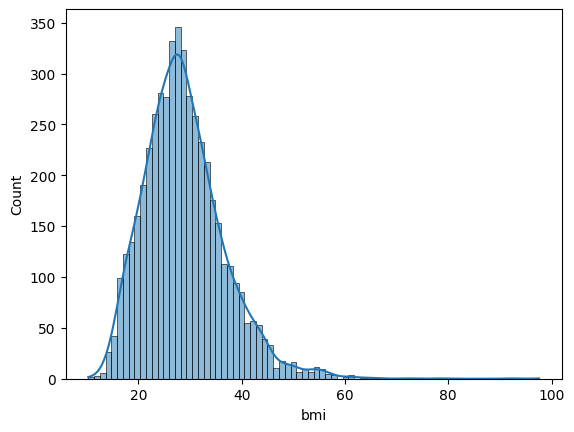

Mean of BMI: 28.893236911794666
Median of BMI: 28.1
Skewness of BMI: 1.0553402052962912


In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Check the distribution of bmi
sns.histplot(df['bmi'].dropna(), kde=True)
plt.show()

# Calculate mean, median, and skewness
mean_bmi = df['bmi'].mean()
median_bmi = df['bmi'].median()
skewness_bmi = df['bmi'].skew()

print(f"Mean of BMI: {mean_bmi}")
print(f"Median of BMI: {median_bmi}")
print(f"Skewness of BMI: {skewness_bmi}")

handle the missing values, we'll fill bmi with the median since the distribution is a bit skewed and just leave unknown smoking as another category, since there are actually quite a significant amount of people with unknown smoking status.

In [10]:
df['bmi'].fillna(median_bmi, inplace=True)

### Make dummies

In [11]:
df_cat = df.select_dtypes('object').columns
df_num = df.drop(df_cat, axis = 1)
dummies = pd.get_dummies(df[df_cat])
df_dummy = pd.concat([df_num, dummies], axis = 1).drop('id', axis = 1)
features = list(df_dummy.drop('stroke', axis = 1).columns)

shouldnt drop unknowns cus there are a significant amount of stroke cases in there. 

### Check for class imbalance

In [12]:
# Assuming df_dummy is your DataFrame and 'target' is the name of your target column.
# Replace 'target' with the actual name of your target column.

# Count the frequency of each class
class_distribution = df_dummy['stroke'].value_counts()

# Calculate the percentage of each class
class_percentage = df_dummy['stroke'].value_counts(normalize=True) * 100

# Print the results
print("Class Distribution:\n", class_distribution)
print("\nClass Percentage:\n", class_percentage)


Class Distribution:
 stroke
0    4861
1     249
Name: count, dtype: int64

Class Percentage:
 stroke
0    95.127202
1     4.872798
Name: proportion, dtype: float64


#### Use stratified shuffle split to maintain the class distribution in both the training and test sets.  

In [13]:
X = df_dummy.drop('stroke', axis = 1)
y = df_dummy['stroke']

sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

print("Train Set - Class Distribution:\n", y_train.value_counts(normalize=True))
print("\nTest Set - Class Distribution:\n", y_test.value_counts(normalize=True))

Train Set - Class Distribution:
 stroke
0    0.951321
1    0.048679
Name: proportion, dtype: float64

Test Set - Class Distribution:
 stroke
0    0.951076
1    0.048924
Name: proportion, dtype: float64


There is a lot of class imbalance. Only around 5% of our data is considered likely to have a stroke. We will need to address this.

### Use SMOTE to counter class imbalance

In [14]:
# Check the distribution of target variable before applying SMOTE
print("Before SMOTE, counts of label '1': {}".format(sum(y_train==1)))
print("Before SMOTE, counts of label '0': {} \n".format(sum(y_train==0)))

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Check the distribution of target variable after applying SMOTE
print("After SMOTE, counts of label '1': {}".format(sum(y_train_smote==1)))
print("After SMOTE, counts of label '0': {}".format(sum(y_train_smote==0)))

# You can now use X_train_smote and y_train_smote for model training


Before SMOTE, counts of label '1': 199
Before SMOTE, counts of label '0': 3889 



After SMOTE, counts of label '1': 3889
After SMOTE, counts of label '0': 3889


In [15]:
# Count the frequency of each class
class_distribution = y_train_smote.value_counts()

# Calculate the percentage of each class
class_percentage = y_train_smote.value_counts(normalize=True) * 100

# Print the results
print("Class Distribution:\n", class_distribution)
print("\nClass Percentage:\n", class_percentage)

Class Distribution:
 stroke
0    3889
1    3889
Name: count, dtype: int64

Class Percentage:
 stroke
0    50.0
1    50.0
Name: proportion, dtype: float64


## 3. Simple Decision Tree

#### With SMOTE

Accuracy: 0.9001956947162426
F1 Score: 0.15
AUC: 0.5586213991769547
False Positive Rate: 0.06275720164609054
False Negative Rate: 0.82


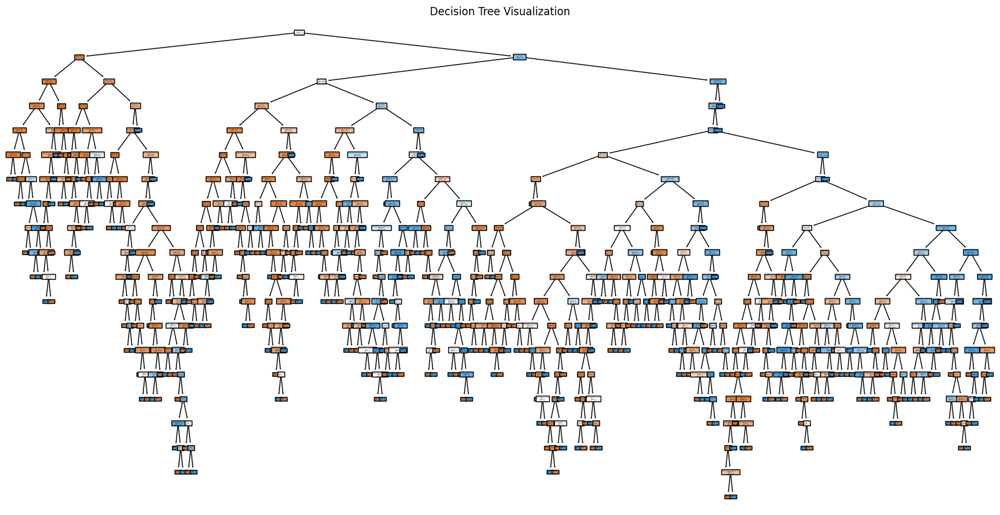

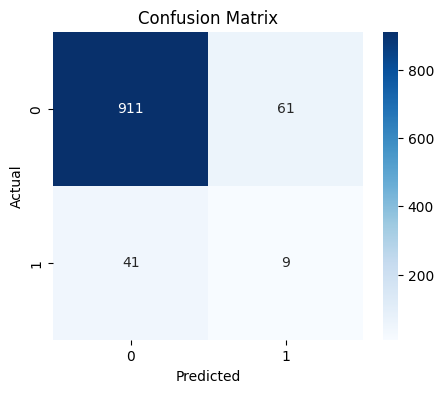

In [16]:
random_state = 42
decision_tree = DecisionTreeClassifier(random_state=random_state)

decision_tree.fit(X_train_smote, y_train_smote)

# Calculate metrics for the decision tree model
predictions = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
auc = roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:, 1]) if hasattr(decision_tree, "predict_proba") else roc_auc_score(y_test, decision_tree.decision_function(X_test))
tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
fpr = fp / (fp + tn)  # False Positive Rate
fnr = fn / (fn + tp)  # False Negative Rate

# Print the metrics
print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("AUC:", auc)
print("False Positive Rate:", fpr)
print("False Negative Rate:", fnr)
plt.figure(figsize=(20,10))
plot_tree(decision_tree, filled=True, feature_names=list(X_train.columns), class_names=["Class 0", "Class 1"])
plt.title("Decision Tree Visualization")
plt.show()

# Display the confusion matrix using seaborn
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, predictions), annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


We get a decent model in terms of AUC 

#### Without SMOTE

Accuracy: 0.9148727984344422
F1 Score: 0.24347826086956526
AUC: 0.6137654320987654
False Positive Rate: 0.05246913580246913
False Negative Rate: 0.72


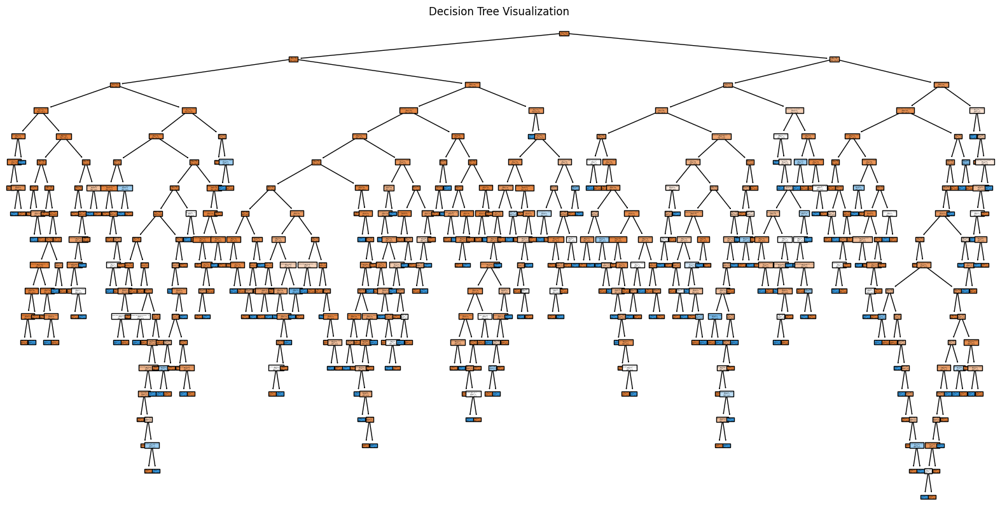

In [17]:
decision_tree = DecisionTreeClassifier(random_state=random_state)

decision_tree.fit(X_train, y_train)

# Calculate metrics for the decision tree model
predictions = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
auc = roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:, 1]) if hasattr(decision_tree, "predict_proba") else roc_auc_score(y_test, decision_tree.decision_function(X_test))
tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
fpr = fp / (fp + tn)  # False Positive Rate
fnr = fn / (fn + tp)  # False Negative Rate

# Print the metrics
print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("AUC:", auc)
print("False Positive Rate:", fpr)
print("False Negative Rate:", fnr)

# Plot the decision tree
plt.figure(figsize=(20,10))
plot_tree(decision_tree, filled=True, feature_names=list(X_train.columns), class_names=["Class 0", "Class 1"])
plt.title("Decision Tree Visualization")
plt.show()


#### Make a decision tree that is interpretable by setting a maximum depth

Best max_depth: 4
Best score: 0.9037327289876507
Accuracy: 0.7348336594911937
F1 Score: 0.1812688821752266
AUC: 0.7591152263374487
False Positive Rate: 0.25823045267489714
False Negative Rate: 0.4


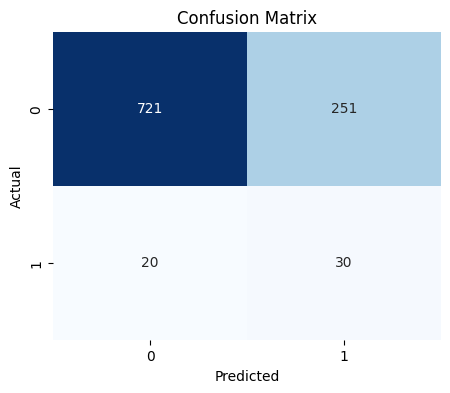

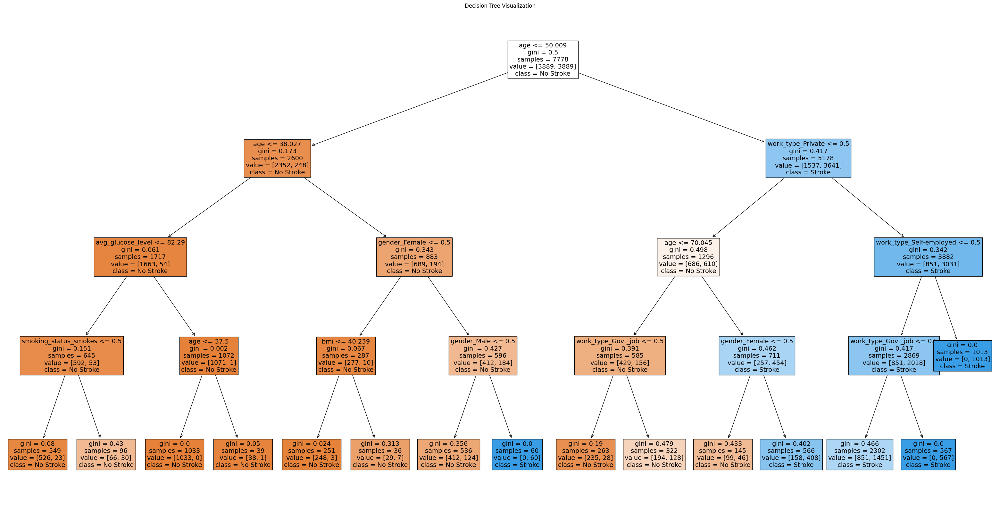

In [18]:
# Define the parameter grid for 'max_depth'
param_grid = {'max_depth': range(1, 5)}  # Adjust the range as needed

# Create a decision tree classifier object
decision_tree = DecisionTreeClassifier()

# Create a grid search object with cross-validation and AUC as the scoring metric
grid_search = GridSearchCV(decision_tree, param_grid, cv=5, scoring='roc_auc')

# Fit the grid search to the data
grid_search.fit(X_train_smote, y_train_smote)

# Print the best parameters and the corresponding score
print("Best max_depth:", grid_search.best_params_['max_depth'])
print("Best score:", grid_search.best_score_)

decision_tree = DecisionTreeClassifier(max_depth = grid_search.best_params_['max_depth'])
decision_tree.fit(X_train_smote, y_train_smote)

predictions = decision_tree.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
auc = roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:, 1]) if hasattr(decision_tree, "predict_proba") else roc_auc_score(y_test, decision_tree.decision_function(X_test))
tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
fpr = fp / (fp + tn)  # False Positive Rate
fnr = fn / (fn + tp)  # False Negative Rate

# Print the metrics
print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("AUC:", auc)
print("False Positive Rate:", fpr)
print("False Negative Rate:", fnr)

# Plot the confusion matrix
plt.figure(figsize=(5, 4))
cm = confusion_matrix(y_test, predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

plt.figure(figsize=(40, 20))
plot_tree(decision_tree, filled=True, feature_names=list(X_train.columns), class_names=["No Stroke", "Stroke"], fontsize = 14)
plt.title("Decision Tree Visualization")
plt.show()

### Here we have our first interpretable model: Simple decision tree with shallow max depth to preserve interpretability.


## 4. Train all the models looked at in class; compare their AUC  to find the best model

#### With SMOTE

In [19]:
random_state = 42 # Can be any number

logistic_regression = LogisticRegression(random_state=random_state)
decision_tree = DecisionTreeClassifier(random_state=random_state)
random_forest = RandomForestClassifier(random_state=random_state)
svm = SVC(probability=True, random_state=random_state)
extra_trees = ExtraTreesClassifier(random_state=random_state)
gradient_boosting = CatBoostClassifier(verbose=False, random_state=random_state)
bagging_decision_tree = BaggingClassifier(estimator=decision_tree, n_estimators=10, random_state=random_state)  # Added Bagging Classifier for Decision Tree

models = [decision_tree, bagging_decision_tree, extra_trees, random_forest, svm, gradient_boosting, logistic_regression]  # Added Bagging Classifier to the list of models
model_names = ['Decision Tree','Bagged Decision Tree', 'Extra Trees', 'Random Forest', 'SVM', 'Gradient Boosting', 'Logistic Regression']  # Added Bagging Classifier to the list of model names

# Initialize StandardScaler
scaler = StandardScaler()

# Adjust your existing loop for training and evaluating models
scores = []

for model, name in zip(models, model_names):
    # Apply scaling for Logistic Regression and SVM
    if name in ['Logistic Regression', 'SVM']:
        X_train_SMOTE_scaled = scaler.fit_transform(X_train_smote)
        X_test_scaled = scaler.transform(X_test)
        model.fit(X_train_SMOTE_scaled, y_train_smote)
        predictions = model.predict(X_test_scaled)
    else:
        model.fit(X_train_smote, y_train_smote)  # Use original data for other models
        predictions = model.predict(X_test)

    # Standard metrics
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, "predict_proba") else roc_auc_score(y_test, model.decision_function(X_test))

    # Confusion matrix and custom metrics
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    fpr = fp / (fp + tn)  # False Positive Rate
    fnr = fn / (fn + tp)  # False Negative Rate

    scores.append((name, accuracy, auc, f1, fpr, fnr))

# Creating a DataFrame to display the scores including custom loss, FPR, and FNR
scores_df = pd.DataFrame(scores, columns=['Model', 'Accuracy', 'AUC', 'F1 Score', 'False Positive Rate', 'False Negative Rate'])
print(scores_df)

print("Model with Max AUC:", scores_df.loc[scores_df['AUC'].idxmax()]['Model'],)
print('AUC: ', scores_df['AUC'].max())

X has feature names, but SVC was fitted without feature names


                  Model  Accuracy       AUC  F1 Score  False Positive Rate   
0         Decision Tree  0.900196  0.558621  0.150000             0.062757  \
1  Bagged Decision Tree  0.932485  0.686481  0.054795             0.021605   
2           Extra Trees  0.934442  0.757870  0.028986             0.018519   
3         Random Forest  0.943249  0.805761  0.000000             0.008230   
4                   SVM  0.951076  0.500000  0.000000             0.000000   
5     Gradient Boosting  0.942270  0.807798  0.092308             0.012346   
6   Logistic Regression  0.951076  0.525206  0.000000             0.000000   

   False Negative Rate  
0                 0.82  
1                 0.96  
2                 0.98  
3                 1.00  
4                 1.00  
5                 0.94  
6                 1.00  
Model with Max AUC: Gradient Boosting
AUC:  0.807798353909465


X has feature names, but LogisticRegression was fitted without feature names


#### without SMOTE

In [20]:
random_state = 42 # Can be any number

logistic_regression = LogisticRegression(random_state=random_state)
decision_tree = DecisionTreeClassifier(random_state=random_state)
random_forest = RandomForestClassifier(random_state=random_state)
svm = SVC(probability=True, random_state=random_state)
extra_trees = ExtraTreesClassifier(random_state=random_state)
gradient_boosting = CatBoostClassifier(verbose=False, random_state=random_state)
bagging_decision_tree = BaggingClassifier(estimator=decision_tree, n_estimators=10, random_state=random_state)  # Added Bagging Classifier for Decision Tree

models = [decision_tree, bagging_decision_tree, extra_trees, random_forest, svm, gradient_boosting, logistic_regression]  # Added Bagging Classifier to the list of models
model_names = ['Decision Tree','Bagged Decision Tree', 'Extra Trees', 'Random Forest', 'SVM', 'Gradient Boosting', 'Logistic Regression']  # Added Bagging Classifier to the list of model names

# Initialize StandardScaler
scaler = StandardScaler()

# Adjust your existing loop for training and evaluating models
scores = []

for model, name in zip(models, model_names):
    # Apply scaling for Logistic Regression and SVM
    if name in ['Logistic Regression', 'SVM']:
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        model.fit(X_train_scaled, y_train)
        predictions = model.predict(X_test_scaled)
    else:
        model.fit(X_train, y_train)  # Use original data for other models
        predictions = model.predict(X_test)

    # Standard metrics
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, "predict_proba") else roc_auc_score(y_test, model.decision_function(X_test))

    # Confusion matrix and custom metrics
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    fpr = fp / (fp + tn)  # False Positive Rate
    fnr = fn / (fn + tp)  # False Negative Rate

    scores.append((name, accuracy, auc, f1, fpr, fnr))

# Creating a DataFrame to display the scores including custom loss, FPR, and FNR
scores_df = pd.DataFrame(scores, columns=['Model', 'Accuracy', 'AUC', 'F1 Score', 'False Positive Rate', 'False Negative Rate'])
print(scores_df)

print("Model with Max AUC:", scores_df.loc[scores_df['AUC'].idxmax()]['Model'],)
print('AUC: ', scores_df['AUC'].max())

X has feature names, but SVC was fitted without feature names


                  Model  Accuracy       AUC  F1 Score  False Positive Rate   
0         Decision Tree  0.914873  0.613765  0.243478             0.052469  \
1  Bagged Decision Tree  0.951076  0.752160  0.074074             0.002058   
2           Extra Trees  0.942270  0.740051  0.032787             0.010288   
3         Random Forest  0.950098  0.800833  0.000000             0.001029   
4                   SVM  0.951076  0.500000  0.000000             0.000000   
5     Gradient Boosting  0.951076  0.840514  0.038462             0.001029   
6   Logistic Regression  0.951076  0.577160  0.000000             0.000000   

   False Negative Rate  
0                 0.72  
1                 0.96  
2                 0.98  
3                 1.00  
4                 1.00  
5                 0.98  
6                 1.00  
Model with Max AUC: Gradient Boosting
AUC:  0.8405144032921811


X has feature names, but LogisticRegression was fitted without feature names


The false negative rate without SMOTE is extremely high, always 1 or close to it. Our models are almost always predicting 0 which is not good. 

### Gradient boost has the best AUC score. So we will later elaborate more on this model.

Baseline Gradientboost Model Metrics:
Accuracy: 0.9422700587084148
F1 Score: 0.09230769230769231
AUC: 0.807798353909465
False Positive Rate: 0.012345679012345678
False Negative Rate: 0.94


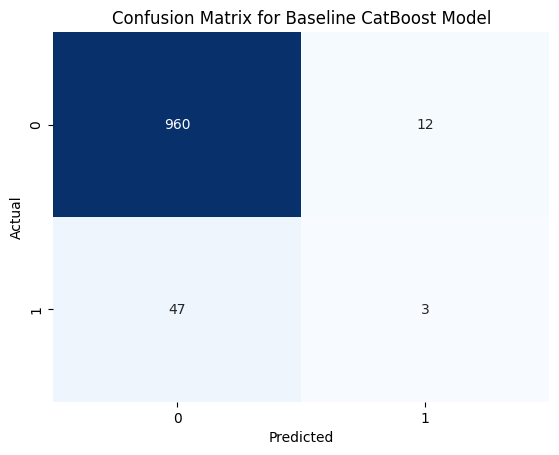

In [21]:
# Train the CatBoost model
baseline_model = CatBoostClassifier(verbose=False, random_state=random_state)
baseline_model.fit(X_train_smote, y_train_smote)

# Make predictions using the trained model
predictions_baseline = baseline_model.predict(X_test)

# Calculate metrics for the CatBoost model
accuracy_baseline = accuracy_score(y_test, predictions_baseline)
f1_baseline = f1_score(y_test, predictions_baseline)
auc_baseline = roc_auc_score(y_test, baseline_model.predict_proba(X_test)[:, 1]) if hasattr(baseline_model, "predict_proba") else roc_auc_score(y_test, baseline_model.decision_function(X_test))
tn_baseline, fp_baseline, fn_baseline, tp_baseline = confusion_matrix(y_test, predictions_baseline).ravel()
fpr_baseline = fp_baseline / (fp_baseline + tn_baseline)  # False Positive Rate
fnr_baseline = fn_baseline / (fn_baseline + tp_baseline)  # False Negative Rate

# Print the metrics for the baseline CatBoost model
print("Baseline Gradientboost Model Metrics:")
print("Accuracy:", accuracy_baseline)
print("F1 Score:", f1_baseline)
print("AUC:", auc_baseline)
print("False Positive Rate:", fpr_baseline)
print("False Negative Rate:", fnr_baseline)

# Plot the confusion matrix for the baseline CatBoost model
cm = confusion_matrix(y_test, predictions_baseline)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Baseline CatBoost Model')
plt.show()

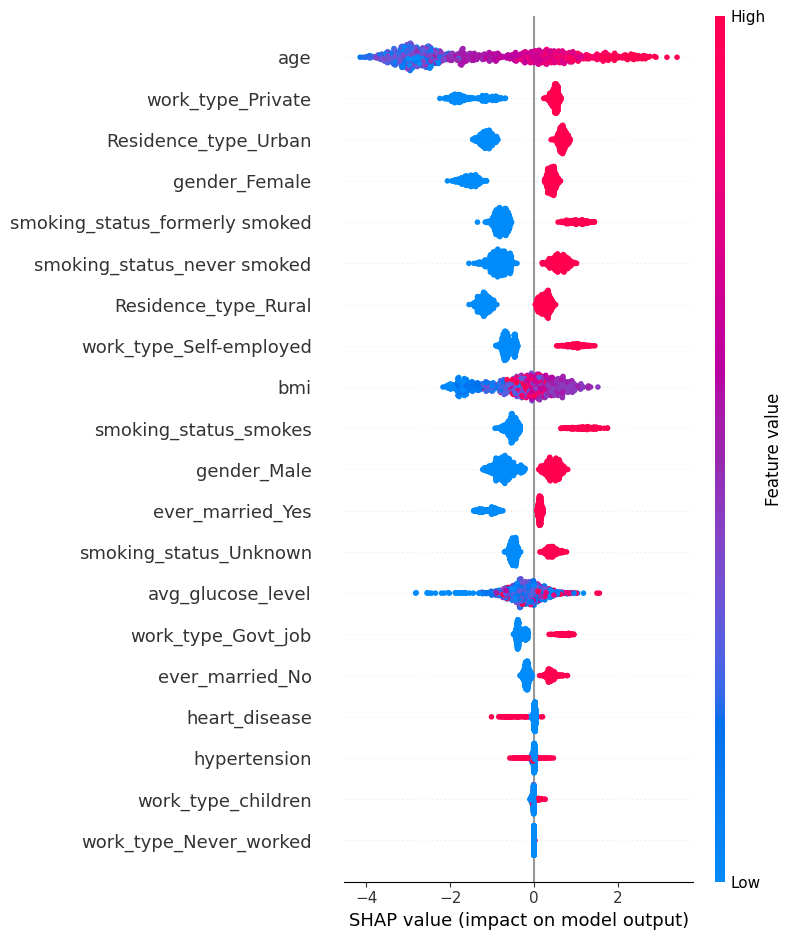

In [22]:
shap.initjs()
explainer = shap.TreeExplainer(baseline_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

## 5. Control number of candidates for cutting

### Manual Factor Encoding

In [23]:
df_factor = df_dummy.copy() #make a new df for the factor encoding
# Assuming df_factor is your DataFrame

# Combine 'smoking_status_formerly smoked' and 'smoking_status_smokes'
df_factor['smoking_status_current_or_past'] = df_factor['smoking_status_formerly smoked'] | df_factor['smoking_status_smokes']
df_factor.drop(['smoking_status_formerly smoked', 'smoking_status_smokes'], axis=1, inplace=True)

# Combine 'work_type_Never_worked' and 'work_type_children'
df_factor['work_type_not_working'] = df_factor['work_type_Never_worked'] | df_factor['work_type_children']
df_factor.drop(['work_type_Never_worked', 'work_type_children'], axis=1, inplace=True)
factor_features = list(df_factor.drop('stroke',axis = 1).columns)

In [24]:
X_factor = df_factor.drop('stroke', axis = 1)
y_factor = df_factor['stroke']

sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
for train_index, test_index in sss.split(X, y):
    X_train_factor, X_test_factor = X_factor.iloc[train_index], X_factor.iloc[test_index]
    y_train_factor, y_test_factor = y_factor.iloc[train_index], y_factor.iloc[test_index]

print("Train Set - Class Distribution:\n", y_train_factor.value_counts(normalize=True))
print("\nTest Set - Class Distribution:\n", y_test_factor.value_counts(normalize=True))

# Check the distribution of target variable before applying SMOTE
print("Before SMOTE, counts of label '1': {}".format(sum(y_train_factor==1)))
print("Before SMOTE, counts of label '0': {} \n".format(sum(y_train_factor==0)))

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote_factor, y_train_smote_factor = smote.fit_resample(X_train_factor, y_train_factor)

# Check the distribution of target variable after applying SMOTE
print("After SMOTE, counts of label '1': {}".format(sum(y_train_smote_factor==1)))
print("After SMOTE, counts of label '0': {}".format(sum(y_train_smote_factor==0)))

# You can now use X_train_smote and y_train_smote for model training

Train Set - Class Distribution:
 stroke
0    0.951321
1    0.048679
Name: proportion, dtype: float64

Test Set - Class Distribution:
 stroke
0    0.951076
1    0.048924
Name: proportion, dtype: float64
Before SMOTE, counts of label '1': 199
Before SMOTE, counts of label '0': 3889 

After SMOTE, counts of label '1': 3889
After SMOTE, counts of label '0': 3889


### Train gradient boost model, this time manually controlling the candidates for splitting based on our domain knowledge.
We also output the baseline gradient boosting model to compare.

Factor Model Accuracy: 0.9422700587084148
Factor Model F1 Score: 0.14492753623188404
Factor AUC: 0.7985185185185186
Factor Model FNR: 0.9
Factor Model FPR: 0.01440329218106996


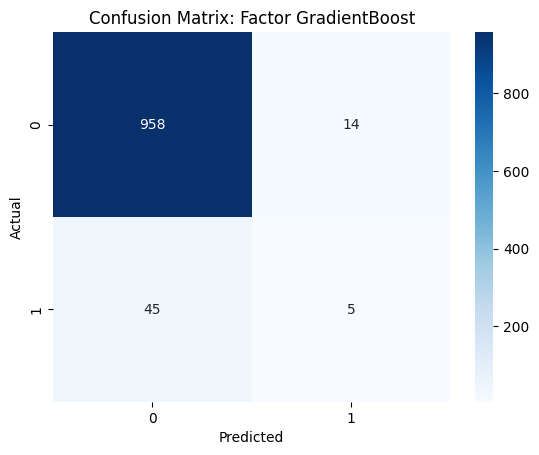

Baseline Gradientboost Model Metrics:
Accuracy: 0.9422700587084148
F1 Score: 0.09230769230769231
AUC: 0.807798353909465
False Positive Rate: 0.012345679012345678
False Negative Rate: 0.94


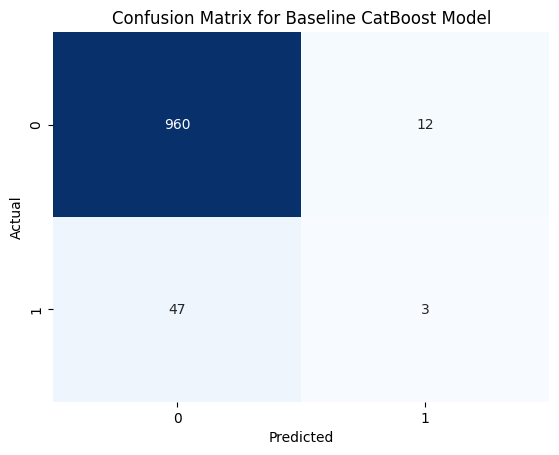

In [25]:
# Train a gradientboost based on this data
gradientboost_factor = CatBoostClassifier(verbose=False, random_state=random_state)
gradientboost_factor.fit(X_train_smote_factor, y_train_smote_factor)

# Assuming `X_test_factor` and `y_test_factor` are defined and `gradientboost_factor` is the trained model
# Get binary predictions using the default threshold of 0.5
predicted_classes_factor = gradientboost_factor.predict(X_test_factor)

# Recalculate the metrics with the new predictions
factor_accuracy = accuracy_score(y_test_factor, predicted_classes_factor)
factor_f1 = f1_score(y_test_factor, predicted_classes_factor)
factor_tn, factor_fp, factor_fn, factor_tp = confusion_matrix(y_test_factor, predicted_classes_factor).ravel()
factor_fpr = factor_fp / (factor_fp + factor_tn)  # New False Positive Rate
factor_fnr = factor_fn / (factor_fn + factor_tp)  # New False Negative Rate
factor_auc = roc_auc_score(y_test_factor, gradientboost_factor.predict_proba(X_test_factor)[:, 1])

# Print the factor metrics
print("Factor Model Accuracy:", factor_accuracy)
print("Factor Model F1 Score:", factor_f1)
print("Factor AUC:", factor_auc)
print("Factor Model FNR:", factor_fnr)
print("Factor Model FPR:", factor_fpr)

# Visualize the factor confusion matrix
factor_conf_matrix = confusion_matrix(y_test_factor, predicted_classes_factor) 
sns.heatmap(factor_conf_matrix, annot=True, fmt='d', cmap='Blues') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.title('Confusion Matrix: Factor GradientBoost')
plt.show()

# Print the metrics for the baseline CatBoost model
print("Baseline Gradientboost Model Metrics:")
print("Accuracy:", accuracy_baseline)
print("F1 Score:", f1_baseline)
print("AUC:", auc_baseline)
print("False Positive Rate:", fpr_baseline)
print("False Negative Rate:", fnr_baseline)

# Plot the confusion matrix for the baseline CatBoost model
cm = confusion_matrix(y_test, predictions_baseline)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Baseline CatBoost Model')
plt.show()

### Show the shapely values for the gradientboost with the factor encoding

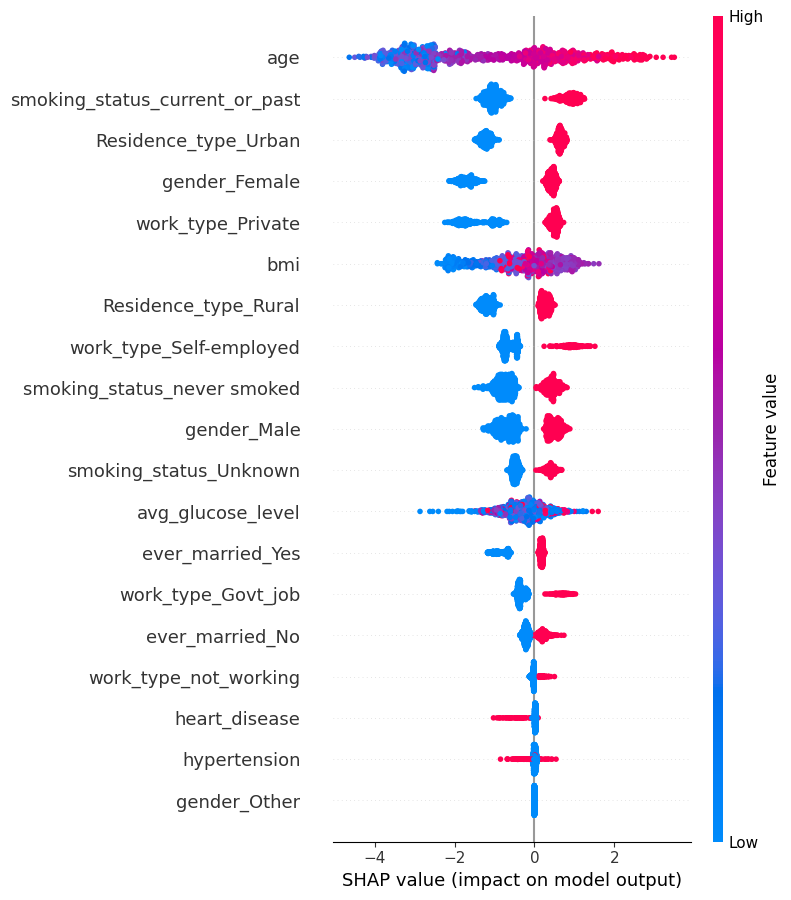

In [26]:
# Create a SHAP explainer object
explainer = shap.TreeExplainer(gradientboost_factor)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test_factor)

# Check the structure of SHAP values and use the appropriate array
if isinstance(shap_values, list):
    shap_values_for_plot = shap_values[1]  # For models that output probabilities for both classes
else:
    shap_values_for_plot = shap_values  # For models that output probabilities for one class

# Generate the summary plot
shap.summary_plot(shap_values_for_plot, X_test_factor)

### **Let catboost handle everything, it has built in ways to automatically explore more candidates for splitting.**

Split Selection for Categorical Features:

CatBoost uses a specific algorithm to handle categorical features effectively. For each categorical feature, CatBoost considers all possible splits based on the category values. It doesn't require pre-processing like one-hot encoding, which significantly reduces the computational complexity and memory usage, especially for high-cardinality categorical features.
Greedy Algorithm for Split Finding:

The algorithm used for finding the best split is greedy. CatBoost evaluates the potential splits based on a given criterion (like Gini impurity, information gain, etc.) and selects the one that provides the best improvement.
Feature Combinations:

CatBoost can create combinations of categorical features and evaluate splits on these combinations. This can lead to the discovery of more informative splits that might not be apparent when considering features individually.
Numerical Features:

For numerical features, CatBoost uses histogram-based algorithms to find the best splits. It groups the values of a numerical feature into a fixed number of bins (configurable by parameters) to find the optimal split points, which is a common approach in modern gradient boosting methods.
Border Count Selection:

When dealing with numerical features, CatBoost automatically selects the number of borders (split points) based on the training data. This process is similar to binning but is done internally and optimized for performance and effectiveness.
Overfitting Prevention:

The algorithm includes several mechanisms to prevent overfitting, such as randomized subsampling of features and instances for each split search, as well as L2 regularization on leaf values.
Efficiency and Speed:

CatBoost is designed to be fast and memory-efficient. It uses a novel Oblivious Trees algorithm, where all instances in a node are split in the same way. This architecture allows for faster execution and simpler optimization.

In [70]:
from imblearn.over_sampling import SMOTENC # use different kind of SMOTE designed for categorical features

# Select categorical and numerical features
df_cat = df.select_dtypes('object').columns
df_num = df.select_dtypes(exclude='object')

# Drop the 'id' column if it exists and is not relevant for modeling
df = df.drop('id', axis=1, errors='ignore')

# Split the dataset into features (X) and target (y)
X_cb = df.drop('stroke', axis=1)
y_cb = df['stroke']

from sklearn.model_selection import StratifiedShuffleSplit
from imblearn.over_sampling import SMOTENC

# ... your existing code to prepare X_cb and y_cb ...

# First Stratified Shuffle Split: Separate training and combined test-validation set
sss1_cb = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
for train_index, test_val_index in sss1_cb.split(X_cb, y_cb):
    X_train_cb, X_test_val_cb = X_cb.iloc[train_index], X_cb.iloc[test_val_index]
    y_train_cb, y_test_val_cb = y_cb.iloc[train_index], y_cb.iloc[test_val_index]

# Second Stratified Shuffle Split: Separate the test and validation sets
sss2_cb = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)  # 50-50 split for test and validation
for test_index, val_index in sss2_cb.split(X_test_val_cb, y_test_val_cb):
    X_test_cb, X_val_cb = X_test_val_cb.iloc[test_index], X_test_val_cb.iloc[val_index]
    y_test_cb, y_val_cb = y_test_val_cb.iloc[test_index], y_test_val_cb.iloc[val_index]

# Identify indices of categorical columns for SMOTENC
cat_indices_cb = [X_train_cb.columns.get_loc(col) for col in df_cat]

# Apply SMOTENC only on the training data
smote_nc_cb = SMOTENC(categorical_features=cat_indices_cb, random_state=42)
X_train_smote_cb, y_train_smote_cb = smote_nc_cb.fit_resample(X_train_cb, y_train_cb)

# X_train_smote_cb, y_train_smote_cb, X_val_cb, y_val_cb, X_test_cb, and y_test_cb are now ready for CatBoost model training and evaluation


Catboost NO Encoding Metrics:
CatBoost Model Accuracy: 0.8864229765013055
CatBoost Model F1 Score: 0.2434782608695652
CatBoost AUC: 0.7752938123308494
CatBoost Model FNR: 0.6216216216216216
CatBoost Model FPR: 0.0877914951989026


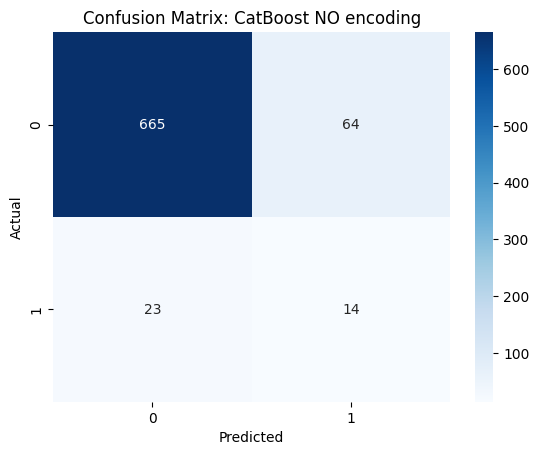

Baseline Gradientboost Model Metrics:
Accuracy: 0.9422700587084148
F1 Score: 0.09230769230769231
AUC: 0.807798353909465
False Positive Rate: 0.012345679012345678
False Negative Rate: 0.94


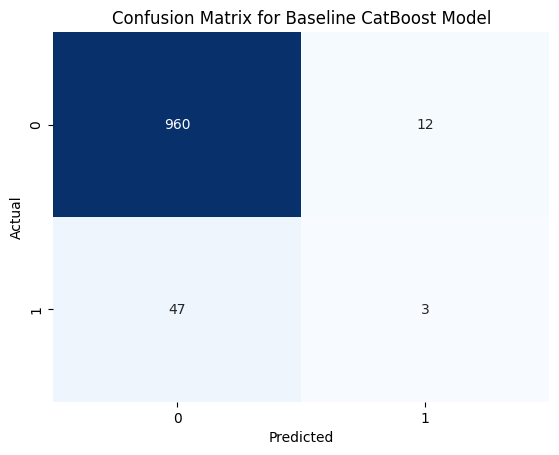

In [71]:
# Train a CatBoost model with verbose = false and random_state = random_state
cb_model = CatBoostClassifier(verbose=False, random_state=random_state)

# Identify the categorical feature indices for CatBoost
cat_features_indices = [X_train_smote_cb.columns.get_loc(col) for col in df_cat]

# Fit the model with the specified categorical feature indices
cb_model.fit(X_train_smote_cb, y_train_smote_cb, cat_features=cat_features_indices)

# Get binary predictions using the default threshold of 0.5
predicted_classes_cb = cb_model.predict(X_test_cb)

# Recalculate the metrics with the new predictions
cb_accuracy = accuracy_score(y_test_cb, predicted_classes_cb)
cb_f1 = f1_score(y_test_cb, predicted_classes_cb)
cb_tn, cb_fp, cb_fn, cb_tp = confusion_matrix(y_test_cb, predicted_classes_cb).ravel()
cb_fpr = cb_fp / (cb_fp + cb_tn)  # New False Positive Rate
cb_fnr = cb_fn / (cb_fn + cb_tp)  # New False Negative Rate
cb_auc = roc_auc_score(y_test_cb, cb_model.predict_proba(X_test_cb)[:, 1])

# Print the CatBoost metrics

print("Catboost NO Encoding Metrics:")
print("CatBoost Model Accuracy:", cb_accuracy)
print("CatBoost Model F1 Score:", cb_f1)
print("CatBoost AUC:", cb_auc)
print("CatBoost Model FNR:", cb_fnr)
print("CatBoost Model FPR:", cb_fpr)

# Visualize the CatBoost confusion matrix
cb_conf_matrix = confusion_matrix(y_test_cb, predicted_classes_cb) 
sns.heatmap(cb_conf_matrix, annot=True, fmt='d', cmap='Blues') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.title('Confusion Matrix: CatBoost NO encoding')
plt.show()

print("Baseline Gradientboost Model Metrics:")
print("Accuracy:", accuracy_baseline)
print("F1 Score:", f1_baseline)
print("AUC:", auc_baseline)
print("False Positive Rate:", fpr_baseline)
print("False Negative Rate:", fnr_baseline)

# Plot the confusion matrix for the baseline CatBoost model
cm = confusion_matrix(y_test, predictions_baseline)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Baseline CatBoost Model')
plt.show()

We see the catboost model without encoding has actually a lower AUC than the one with dummy encoding, but it actually has a lower false negative rate as is. As such, it seems interesting to consider this catboost model that uses the raw data, as it allows for the package to control things like # of candidates for splitting, etc.

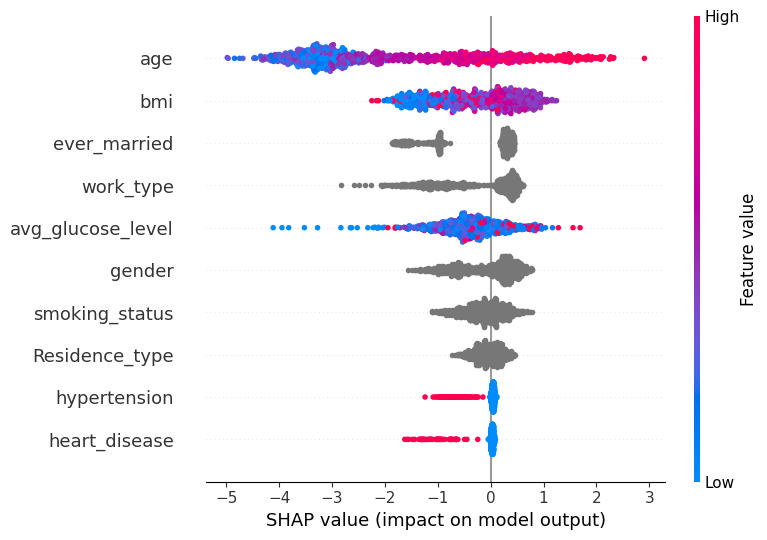

In [29]:
# Create the explainer object with your CatBoost model
explainer = shap.Explainer(cb_model)

# Calculate SHAP values for the test data
shap_values = explainer(X_test_cb)

shap.summary_plot(shap_values, X_test_cb)

Actually here we lose some interpretability by not dummy encoding the features, since now we cannot see how each category within the labels affects the prediction.

## 6. Refining threshold based on domain knowledge and custom loss

### Inverse Frequency Weighting
here we make weights based on the inverse frequency of the minority class.

Weighted Model Accuracy: 0.7818003913894325
Weighted Model F1 Score: 0.22837370242214536
Weighted Model AUC: 0.8035596707818929
Weighted Model FNR: 0.34
Weighted Model FPR: 0.21193415637860083


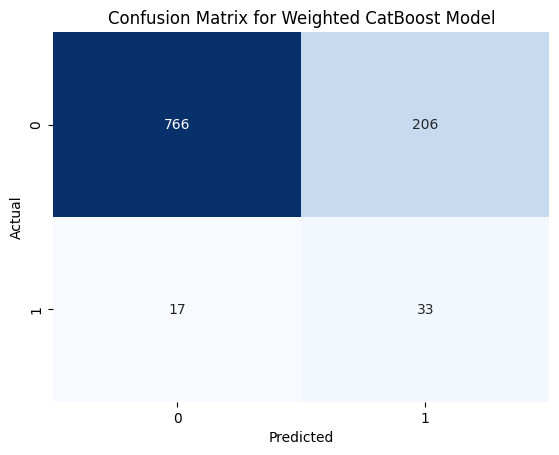

In [30]:
# Calculate class weights based on the inverse frequency of the class in the orginal training data.
weight_for_0 = 1
weight_for_1 = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

# Initialize the CatBoost with class weights
weighted_catboost = CatBoostClassifier(verbose=False, random_state=random_state, class_weights=[1, weight_for_1])

# Fit the model
weighted_catboost.fit(X_train_smote, y_train_smote)

# Predictions
weighted_predictions = weighted_catboost.predict(X_test)

# Evaluation
weighted_accuracy = accuracy_score(y_test, weighted_predictions)
weighted_f1 = f1_score(y_test, weighted_predictions)
weighted_auc = roc_auc_score(y_test, weighted_catboost.predict_proba(X_test)[:, 1])
tn, fp, fn, tp = confusion_matrix(y_test, weighted_predictions).ravel()
weighted_fpr = fp / (fp + tn)  # False Positive Rate
weighted_fnr = fn / (fn + tp)  # False Negative Rate

# Print metrics
print("Weighted Model Accuracy:", weighted_accuracy)
print("Weighted Model F1 Score:", weighted_f1)
print("Weighted Model AUC:", weighted_auc)
print("Weighted Model FNR:", weighted_fnr)
print("Weighted Model FPR:", weighted_fpr)

# Print confusion matrix using seaborn
cm_weighted = confusion_matrix(y_test, weighted_predictions)
sns.heatmap(cm_weighted, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Weighted CatBoost Model')
plt.show()

#### Now we try a few different ratios 1/10, 1/20, 1/30, 1/40 and find the best ratio based on AUC.

In [31]:
# Define the parameter grid
weight_ratios = [10, 20, 30, 40]
param_grid = {'class_weights': [[1, v] for v in weight_ratios]}

# Initialize the Grid Search model
grid_search = GridSearchCV(CatBoostClassifier(verbose=False, random_state=random_state), param_grid, scoring='roc_auc', cv=5)

# Fit the model
grid_search.fit(X_train_smote, y_train_smote)

# Evaluate the best model from the grid search
best_model = grid_search.best_estimator_
cross_val_auc_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='roc_auc')

# Print cross-validated scores
print("Cross-validated AUC scores:", cross_val_auc_scores)

# Print best parameter and corresponding AUC
best_parameters = grid_search.best_params_
best_auc = grid_search.best_score_
print("Best parameters:", best_parameters)
print("Best AUC from Grid Search:", best_auc)


Cross-validated AUC scores: [0.80732648 0.78814267 0.83322622 0.79187265 0.76013514]
Best parameters: {'class_weights': [1, 10]}
Best AUC from Grid Search: 0.9930219059150271


#### Now we print the individual AUC score for each ratio

In [32]:
# Retrieve the mean test scores for each grid search iteration
mean_test_scores = grid_search.cv_results_['mean_test_score']

# Compare AUC for each weight ratio
for weight, score in zip(weight_ratios, mean_test_scores):
    print(f"AUC for weight ratio 1:{weight} is {score}")

AUC for weight ratio 1:10 is 0.9930219059150271
AUC for weight ratio 1:20 is 0.9925680921200379
AUC for weight ratio 1:30 is 0.9920943312977466
AUC for weight ratio 1:40 is 0.9915650295756164


#### Using the best weight ratio, we make some predictions. 

In [33]:
# Use the best model to make predictions
best_model_predictions = best_model.predict(X_test)

# Evaluation
best_model_accuracy = accuracy_score(y_test, best_model_predictions)
best_model_f1 = f1_score(y_test, best_model_predictions)
best_model_auc = roc_auc_score(y_test, best_model.predict_proba(X_test)[:, 1])

# Calculate false negative rate and false positive rate
tn, fp, fn, tp = confusion_matrix(y_test, best_model_predictions).ravel()
fnr = fn / (fn + tp)
fpr = fp / (fp + tn)

# Print metrics
print("Best Model Accuracy:", best_model_accuracy)
print("Best Model F1 Score:", best_model_f1)
print("Best Model AUC:", best_model_auc)
print("Best Model FNR:", fnr)
print("Best Model FPR:", fpr)

Best Model Accuracy: 0.8639921722113503
Best Model F1 Score: 0.2057142857142857
Best Model AUC: 0.7853909465020577
Best Model FNR: 0.64
Best Model FPR: 0.11008230452674897


### Adjust the threshold at which predictions are made
First we make a threshold that makes all false negatives 0. 

Threshold that minimizes FN: 0.0
Accuracy: 0.04892367906066536
F1 Score: 0.09328358208955224
FNR: 0.0
FPR: 1.0
Confusion Matrix:


<Axes: >

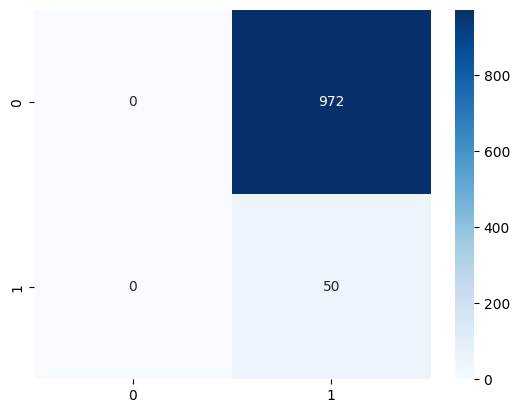

In [34]:
# Get predicted probabilities from the baseline model
predicted_probabilities = baseline_model.predict_proba(X_test)[:, 1]

# Initialize variables to find the threshold that minimizes false negatives
thresholds = np.linspace(0, 1, 1001)
best_threshold = None
min_fn = float('inf')

# Iterate over thresholds to find the one that minimizes false negatives
for threshold in thresholds:
    # Apply the threshold
    predictions = (predicted_probabilities >= threshold).astype(int)
    # Calculate confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    # Update the best threshold
    if fn < min_fn:
        min_fn = fn
        best_threshold = threshold
        if fn == 0:  # Stop if FN is minimized to 0
            break

# Display the best threshold
print(f"Threshold that minimizes FN: {best_threshold}")

# Apply the best threshold to the baseline model's probabilities
final_predictions = (predicted_probabilities >= best_threshold).astype(int)

# Calculate and display metrics for the baseline model with the applied threshold
tn, fp, fn, tp = confusion_matrix(y_test, final_predictions).ravel()
accuracy = accuracy_score(y_test, final_predictions)
f1 = f1_score(y_test, final_predictions)
fnr = fn / (fn + tp)
fpr = fp / (fp + tn)

# Print metrics
print("Accuracy:", accuracy)
print("F1 Score:", f1)
print("FNR:", fnr)
print("FPR:", fpr)
print("Confusion Matrix:")

# Optional: Plotting the confusion matrix
sns.heatmap(confusion_matrix(y_test, final_predictions), annot=True, fmt='g', cmap='Blues')

Quite obviously, this model overfits too much to the data, making the threshold 0 and thus will predict everyone as having a stroke. This is not optimal at all, as it would cause many problems if we were to do this in the real world. As such, we need to come up with a more domain specific approach.

### **Threshold pertaining to domain knowledge**

The justification for these values is given in these bullet points in the report document. Essentially, we use a method outlined in the paper https://bmcmedicine.biomedcentral.com/articles/10.1186/s12916-019-1425-3, and construct costs.

| Outcome | Stroke Occurs (True Condition) | No Stroke (True Condition) |
|---------|--------------------------------|----------------------------|
| Predicted Stroke (Model Prediction) | 20 (C_TP): Costs reflect necessary treatment and rehab, but are minimized by the benefits of early intervention. | 10 (C_FP): Costs account for unnecessary medical procedures, anxiety, and healthcare inefficiencies, but less than a missed stroke. |
| Predicted No Stroke (Model Prediction) | 95 (C_FN): Highest cost due to the risk of severe morbidity or mortality from a missed stroke diagnosis. | 0 (C_TN): No cost as the prediction is accurate and no intervention is needed. |


In [35]:
# Given values
C_FP = 10  # Cost of False Positive
C_FN = 95  # Cost of False Negative
C_TP = 20  # Cost of True Positive

# Calculate the benefit of True Positive
B_TP = C_FN - C_TP

# Calculate the threshold
threshold = C_FP / (C_FP + B_TP)
threshold

0.11764705882352941

#### Adjust threshold on the catboost model WITHOUT encoding

New Accuracy: 0.7064579256360078
New F1 Score: 0.17582417582417584
New False Positive Rate: 0.29012345679012347
New False Negative Rate: 0.36
New AUC Score: 0.7608847736625515


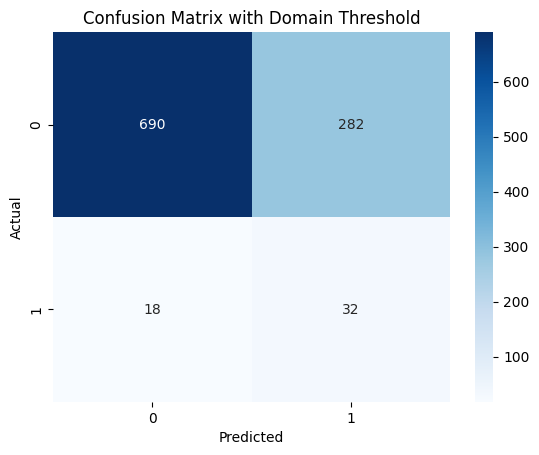

Baseline CatBoost Model Metrics:
Accuracy: 0.9422700587084148
F1 Score: 0.09230769230769231
AUC: 0.807798353909465
False Positive Rate: 0.012345679012345678
False Negative Rate: 0.94


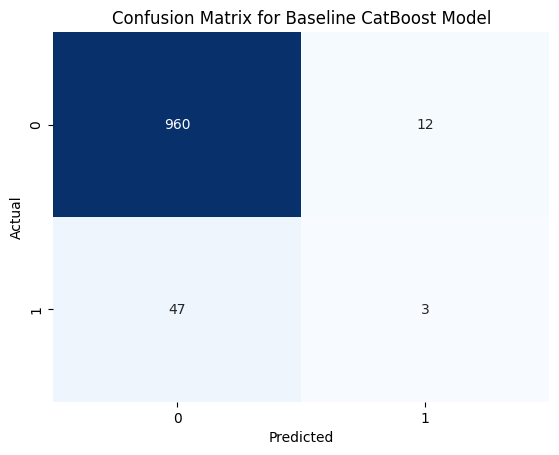

In [36]:
# Assuming cb_model is your trained CatBoost model and threshold is defined
predicted_probabilities = cb_model.predict_proba(X_test_cb)[:, 1]

# Adjust predictions based on the new threshold
new_predictions = np.where(predicted_probabilities >= threshold, 1, 0)

# Calculate new metrics
new_accuracy = accuracy_score(y_test_cb, new_predictions)
new_f1 = f1_score(y_test_cb, new_predictions)
new_tn, new_fp, new_fn, new_tp = confusion_matrix(y_test_cb, new_predictions).ravel()
new_fpr = new_fp / (new_fp + new_tn)  # New False Positive Rate
new_fnr = new_fn / (new_fn + new_tp)  # New False Negative Rate
new_auc = roc_auc_score(y_test_cb, predicted_probabilities)

# Print new metrics
print("New Accuracy:", new_accuracy)
print("New F1 Score:", new_f1)
print("New False Positive Rate:", new_fpr)
print("New False Negative Rate:", new_fnr)
print("New AUC Score:", new_auc)

# Plot the new confusion matrix
conf_matrix = confusion_matrix(y_test_cb, new_predictions) 
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.title('Confusion Matrix with Domain Threshold') 
plt.show()

# Print the metrics for the baseline CatBoost model
print("Baseline CatBoost Model Metrics:")
print("Accuracy:", accuracy_baseline)
print("F1 Score:", f1_baseline)
print("AUC:", auc_baseline)
print("False Positive Rate:", fpr_baseline)
print("False Negative Rate:", fnr_baseline)

# Plot the confusion matrix for the baseline CatBoost model
cm_baseline = confusion_matrix(y_test_cb, predictions_baseline)
sns.heatmap(cm_baseline, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Baseline CatBoost Model')
plt.show()

We decrease the false negative rate by a lot, as expected and keep the same AUC so this is overall good.

### **Optimize threshold using a domain specific test loss function**

Optimal Threshold: 0.40800000000000003
Optimal Loss: 3980
Optimal Model Accuracy: 0.860078277886497
Optimal Model F1 Score: 0.2185792349726776
Optimal AUC: 0.7608847736625515
Optimal Model FNR: 0.6
Optimal Model FPR: 0.11625514403292181


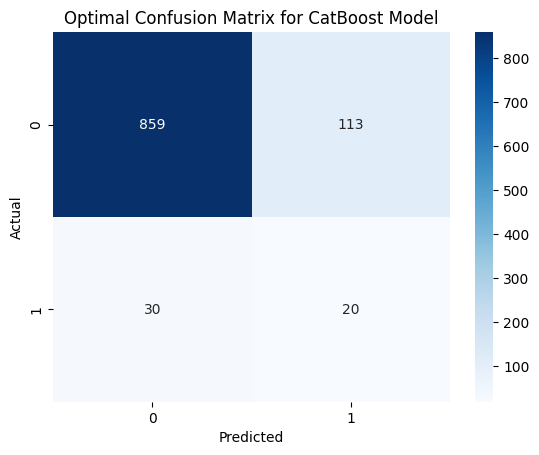

In [37]:
# Define the costs
cost_false_positive = 10  # Cost of a false positive based on domain knowledge
cost_false_negative = 95  # Cost of a false negative based on domain knowledge

def custom_loss(y_true, y_pred, cost_fp, cost_fn):
    """
    Calculate the custom loss given the true labels, predicted labels,
    cost of false positives, and cost of false negatives.
    """
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return (fp * cost_fp) + (fn * cost_fn)

def find_optimal_threshold(probs, y_true, cost_fp, cost_fn):
    """
    Find the optimal threshold for the given probabilities and true labels
    that minimizes the custom loss.
    """
    thresholds = np.linspace(0, 1, 1001)
    best_threshold = None
    min_loss = float('inf')

    for threshold in thresholds:
        # Apply the threshold to get binary predictions
        y_pred = (probs >= threshold).astype(int)
        # Calculate the custom loss
        loss = custom_loss(y_true, y_pred, cost_fp, cost_fn)
        # Update the best threshold that minimizes loss
        if loss < min_loss:
            min_loss = loss
            best_threshold = threshold

    return best_threshold, min_loss

# Assuming cb_model is your trained CatBoost model
# Get predicted probabilities for the positive class (1) from the CatBoost model
predicted_probabilities_cb = cb_model.predict_proba(X_test_cb)[:, 1]

# Find the optimal threshold
optimal_threshold_cb, optimal_loss_cb = find_optimal_threshold(predicted_probabilities_cb, y_test_cb, cost_false_positive, cost_false_negative)

# Apply the optimal threshold to get new predictions
optimal_predictions_cb = (predicted_probabilities_cb >= optimal_threshold_cb).astype(int)

# Output the optimal threshold and the loss
print(f"Optimal Threshold: {optimal_threshold_cb}")
print(f"Optimal Loss: {optimal_loss_cb}")

# Recalculate the metrics with the new predictions
optimal_accuracy_cb = accuracy_score(y_test_cb, optimal_predictions_cb)
optimal_f1_cb = f1_score(y_test_cb, optimal_predictions_cb)
optimal_tn_cb, optimal_fp_cb, optimal_fn_cb, optimal_tp_cb = confusion_matrix(y_test_cb, optimal_predictions_cb).ravel()
optimal_fpr_cb = optimal_fp_cb / (optimal_fp_cb + optimal_tn_cb)  # New False Positive Rate
optimal_fnr_cb = optimal_fn_cb / (optimal_fn_cb + optimal_tp_cb)  # New False Negative Rate
optimal_auc_cb = roc_auc_score(y_test_cb, predicted_probabilities_cb)

# Print the new metrics
print("Optimal Model Accuracy:", optimal_accuracy_cb)
print("Optimal Model F1 Score:", optimal_f1_cb)
print("Optimal AUC:", optimal_auc_cb)
print("Optimal Model FNR:", optimal_fnr_cb)
print("Optimal Model FPR:", optimal_fpr_cb)

# Visualize the optimal confusion matrix
optimal_conf_matrix_cb = confusion_matrix(y_test_cb, optimal_predictions_cb) 
sns.heatmap(optimal_conf_matrix_cb, annot=True, fmt='d', cmap='Blues') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.title('Optimal Confusion Matrix for CatBoost Model') 
plt.show()

## 7. Linear structure (Logistic Regression)

### Train the simple logistic regression model

Accuracy: 0.949119373776908
F1 Score: 0.0
AUC Score: 0.8502469135802471
False Positive Rate: 0.00205761316872428
False Negative Rate: 1.0


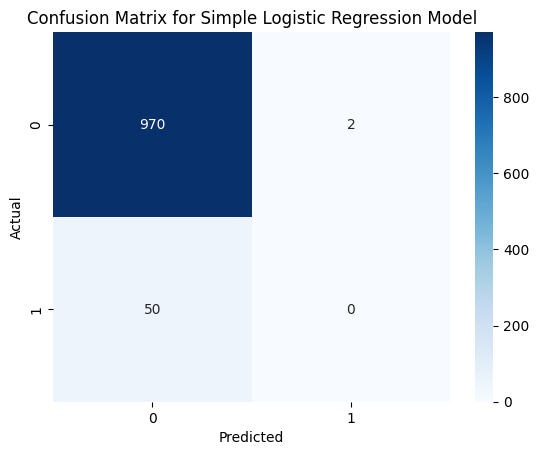

In [38]:
# Assuming X_train, X_test, y_train, y_test are already defined
logreg = LogisticRegression(solver = 'liblinear')
logreg.fit(X_train_smote, y_train_smote)
predicted_probabilities = logreg.predict_proba(X_test)[:,1]
new_predictions = logreg.predict(X_test) 

# Compute accuracy
accuracy = accuracy_score(y_test, new_predictions)
print("Accuracy:", accuracy)

# Compute F1 score
f1 = f1_score(y_test, new_predictions)
print("F1 Score:", f1)

# Compute AUC score
auc = roc_auc_score(y_test, predicted_probabilities)
print("AUC Score:", auc)

# Compute false positive rate and false negative rate
conf_matrix = confusion_matrix(y_test, new_predictions)
tn, fp, fn, tp = conf_matrix.ravel()
fpr = fp / (fp + tn)
fnr = fn / (fn + tp)
print("False Positive Rate:", fpr)
print("False Negative Rate:", fnr)

# Visualize the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Simple Logistic Regression Model')
plt.show()

Simple logistic regression underfits too much, predicts only the 0 class.

### Add Lasso (L1) penalty to the previous logistic regression

Accuracy: 0.9510763209393346
F1 Score: 0.0
AUC Score: 0.8625720164609054
False Positive Rate: 0.0
False Negative Rate: 1.0


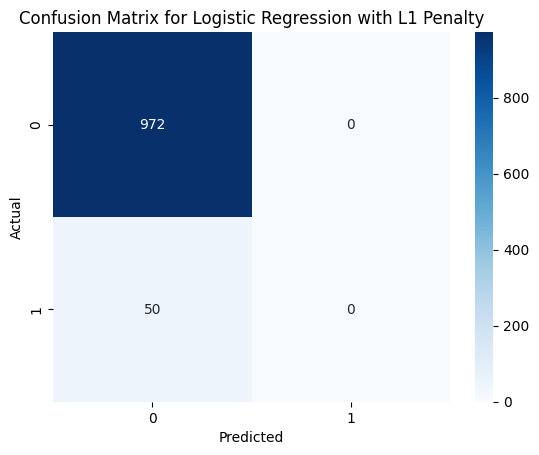

                           Feature  Coefficient
0                              age     0.069647
1                     hypertension    -0.028018
2                    heart_disease    -0.059635
3                avg_glucose_level     0.002657
4                              bmi    -0.008223
5                    gender_Female     5.389805
6                      gender_Male     5.352966
7                     gender_Other     0.000000
8                  ever_married_No     4.088975
9                 ever_married_Yes     4.276764
10              work_type_Govt_job     4.779577
11          work_type_Never_worked     0.000000
12               work_type_Private     5.535600
13         work_type_Self-employed     4.866097
14              work_type_children     6.253414
15            Residence_type_Rural     5.904157
16            Residence_type_Urban     5.997073
17          smoking_status_Unknown     5.691053
18  smoking_status_formerly smoked     5.608837
19     smoking_status_never smoked     5

In [39]:
# Assuming X_train, X_test, y_train, y_test are already defined
logreg = LogisticRegression(penalty = 'l1', solver='liblinear')
logreg.fit(X_train_smote, y_train_smote)
predicted_probabilities = logreg.predict_proba(X_test)[:,1]
new_predictions = logreg.predict(X_test) 

# Compute accuracy
accuracy = accuracy_score(y_test, new_predictions)
print("Accuracy:", accuracy)

# Compute F1 score
f1 = f1_score(y_test, new_predictions)
print("F1 Score:", f1)

# Compute AUC score
auc = roc_auc_score(y_test, predicted_probabilities)
print("AUC Score:", auc)

# Compute false positive rate and false negative rate
conf_matrix = confusion_matrix(y_test, new_predictions)
tn, fp, fn, tp = conf_matrix.ravel()
fpr = fp / (fp + tn)
fnr = fn / (fn + tp)
print("False Positive Rate:", fpr)
print("False Negative Rate:", fnr)

# Visualize the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression with L1 Penalty')
plt.show()

# Assuming 'logreg' is your trained logistic regression model
coefficients = logreg.coef_[0]  # Get the coefficients

# Assuming 'X_train_smote' is your features DataFrame
feature_names = X_train_smote.columns

# Create a DataFrame for coefficients
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

# Display the DataFrame
print(coef_df)

#### Add the threshold based on custom loss function to the logistic regression

0.13 2990
Accuracy: 0.823875
F1 Score: 0.285714
AUC Score: 0.862572
False Positive Rate: 0.170782
False Negative Rate: 0.280000


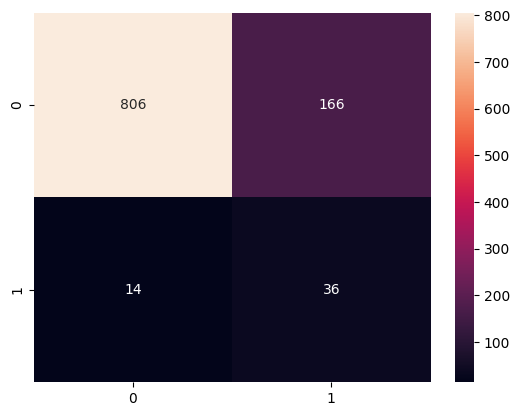

In [40]:
# Define the costs
cost_false_positive = 10  # Cost of a false positive
cost_false_negative = 95  # Cost of a false negative

def custom_loss(y_true, y_pred):
    # Calculate the number of false positives and false negatives
    false_positives = np.sum((y_true == 0) & (y_pred == 1))
    false_negatives = np.sum((y_true == 1) & (y_pred == 0))

    # Calculate the total cost based on the defined costs
    total_cost = (false_positives * cost_false_positive) + (false_negatives * cost_false_negative)

    return total_cost

def find_optimal_threshold(model, X, y, cost_fp, cost_fn):
    # Get the predicted probabilities for the positive class
    y_probs = model.predict_proba(X)[:, 1]

    # Initialize the best threshold and loss to infinity
    best_threshold = None
    best_loss = float('inf')

    # Evaluate thresholds from 0 to 1 by increments of 0.01
    for threshold in np.arange(0, 1.01, 0.01):
        # Convert probabilities to binary predictions based on the current threshold
        y_pred = (y_probs >= threshold).astype(int)

        # Calculate the custom loss
        loss = custom_loss(y, y_pred)
        
        # Update the best threshold and loss if the current loss is lower
        if loss < best_loss:
            best_loss = loss
            best_threshold = threshold

    return best_threshold, best_loss

# Use the function to find the optimal threshold
optimal_threshold, optimal_loss = find_optimal_threshold(logreg, X_test, y_test, cost_false_positive, cost_false_negative)

print(optimal_threshold, optimal_loss)

y_probs = logreg.predict_proba(X_test)[:, 1]

y_pred_optimal = (y_probs >= optimal_threshold).astype(int)

# Calculate the confusion matrix
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_optimal).ravel()

# Calculate the various metrics
accuracy = accuracy_score(y_test, y_pred_optimal)
f1 = f1_score(y_test, y_pred_optimal)
auc = roc_auc_score(y_test, y_probs)
fnr = fn / (fn + tp)  # False Negative Rate
fpr = fp / (fp + tn)  # False Positive Rate

print(f"Accuracy: {accuracy:.6f}")
print(f"F1 Score: {f1:.6f}")
print(f"AUC Score: {auc:.6f}")
print(f"False Positive Rate: {fpr:.6f}")
print(f"False Negative Rate: {fnr:.6f}")

cm = confusion_matrix(y_test, y_pred_optimal)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

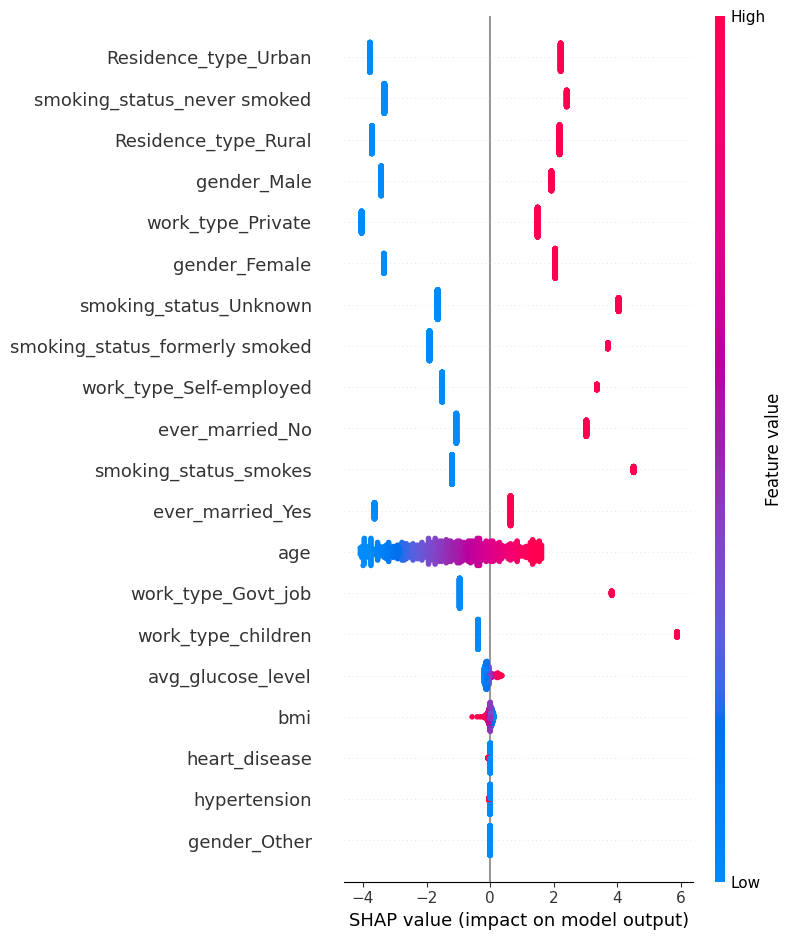

In [41]:
explainer = shap.LinearExplainer(logreg, X_train_smote.astype(float))

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test.astype(float))

# Summarize the SHAP values in a plot (for example, a summary plot)
shap.summary_plot(shap_values, X_test, feature_names=features)

## 8. Hyperparameter tuning

Add hyperparameter tuning for Gradient boosting model and the lasso logistic regression. We have to be careful not to overfit in the validation. The first step we take is to use cross validation for these gridsearches, so as to increase our validation set size to the entire training data, and thus make overfitting LESS likely.

Tune the logistic regression

invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid value encountered in scalar divide
invalid val

Best Parameters: {'C': 10, 'class_weight': {0: 1, 1: 10}, 'penalty': 'l1', 'solver': 'liblinear'}
Lowest Average Loss: 3521.0

Test Set Metrics:
Accuracy: 0.770059
F1 Score: 0.263323
AUC Score: 0.862984
False Positive Rate: 0.233539
False Negative Rate: 0.160000


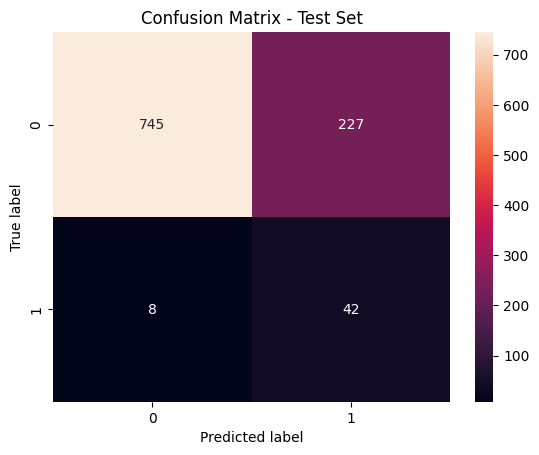


Average Validation Set Metrics:
Accuracy: 0.892438
F1: 0.650957
Auc: nan
Fnr: 0.198206
Fpr: nan


Mean of empty slice


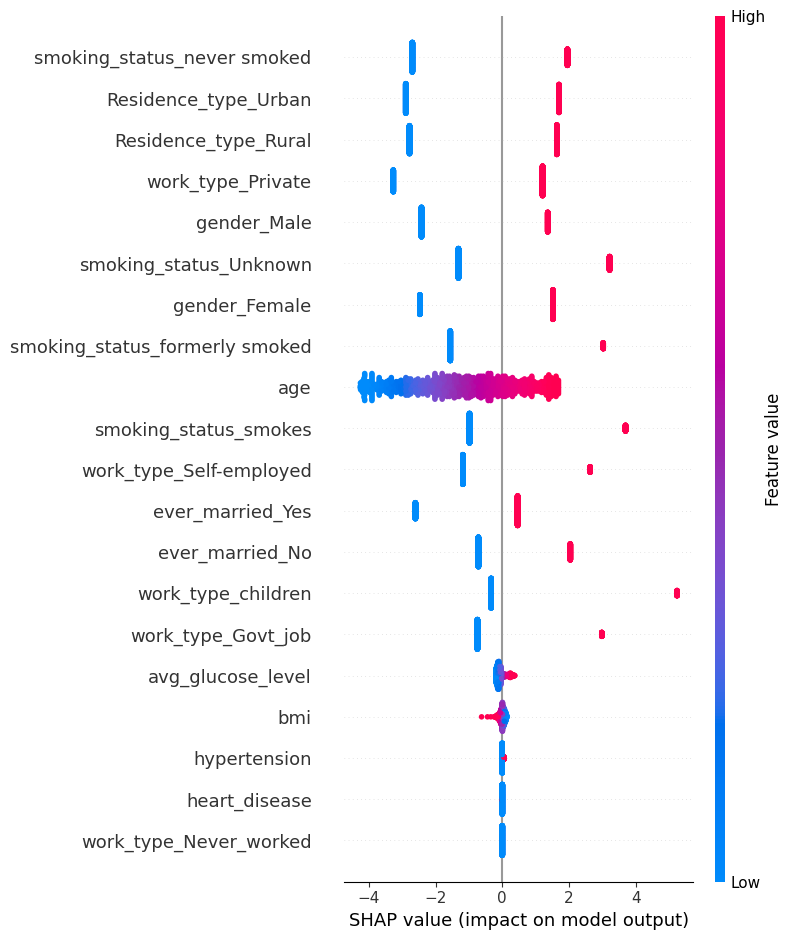

In [85]:
import numpy as np
import pandas as pd
from sklearn.model_selection import ParameterGrid, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Define your custom loss function
def custom_loss(y_true, y_pred, cost_fp=10, cost_fn=95):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return (fp * cost_fp) + (fn * cost_fn)

# Define the costs
cost_false_positive = 10
cost_false_negative = 95

# Define class weights to try in the grid search
class_weights = [
    None,
    {0: 1, 1: 5},
    {0: 1, 1: 10},
    {0: 1, 1: 20}
]

# Define the grid of hyperparameters to search
param_grid = {
    'solver': ['liblinear'],
    'C': [0.1, 1, 10],
    'penalty': ['l1'],
    'class_weight': class_weights
}

# Best model initialization
best_params = {}
lowest_loss = float('inf')
val_metrics_summary = {'accuracy': [], 'f1': [], 'auc': [], 'fnr': [], 'fpr': []}

# Implementing Cross-Validation
kf = KFold(n_splits=5)  # Define the number of splits

for params in ParameterGrid(param_grid):
    fold_losses = []
    fold_val_metrics = {'accuracy': [], 'f1': [], 'auc': [], 'fnr': [], 'fpr': []}

    for train_index, val_index in kf.split(X_train_smote):
        X_train_fold, X_val_fold = X_train_smote.iloc[train_index], X_train_smote.iloc[val_index]
        y_train_fold, y_val_fold = y_train_smote.iloc[train_index], y_train_smote.iloc[val_index]

        model = LogisticRegression(**params)
        model.fit(X_train_fold, y_train_fold)

        # Validate the model
        predictions = model.predict(X_val_fold)
        probs = model.predict_proba(X_val_fold)[:, 1]
        loss = custom_loss(y_val_fold, predictions, cost_false_positive, cost_false_negative)
        fold_losses.append(loss)

        # Calculate metrics for validation set
        fold_val_metrics['accuracy'].append(accuracy_score(y_val_fold, predictions))
        fold_val_metrics['f1'].append(f1_score(y_val_fold, predictions))
        
        # Check if both classes are present for ROC AUC calculation
        if len(np.unique(y_val_fold)) > 1:
            fold_val_metrics['auc'].append(roc_auc_score(y_val_fold, probs))
        else:
            fold_val_metrics['auc'].append(np.nan)  # Assign NaN if AUC can't be computed

        tn, fp, fn, tp = confusion_matrix(y_val_fold, predictions).ravel()
        fold_val_metrics['fnr'].append(fn / (fn + tp))
        fold_val_metrics['fpr'].append(fp / (fp + tn))

    avg_loss = np.mean(fold_losses)
    if avg_loss < lowest_loss:
        lowest_loss = avg_loss
        best_params = params

        # Update validation metrics summary
        for key in val_metrics_summary:
            val_metrics_summary[key].append(np.mean(fold_val_metrics[key]))

# Output the best parameters and the loss
print("Best Parameters:", best_params)
print("Lowest Average Loss:", lowest_loss)

# Re-train the model using the best parameters on the full training set
best_model_lr = LogisticRegression(**best_params)
best_model_lr.fit(X_train_smote, y_train_smote)

# Generate predictions using the best logistic regression model on the test set
y_pred_test = best_model_lr.predict(X_test)
y_probs_test = best_model_lr.predict_proba(X_test)[:, 1]

# Calculate the confusion matrix and various metrics for the test set
tn_test, fp_test, fn_test, tp_test = confusion_matrix(y_test, y_pred_test).ravel()
accuracy_test = accuracy_score(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)
auc_test = roc_auc_score(y_test, y_probs_test)
fnr_test = fn_test / (fn_test + tp_test)
fpr_test = fp_test / (fp_test + tn_test)

# Print test set metrics
print("\nTest Set Metrics:")
print(f"Accuracy: {accuracy_test:.6f}")
print(f"F1 Score: {f1_test:.6f}")
print(f"AUC Score: {auc_test:.6f}")
print(f"False Positive Rate: {fpr_test:.6f}")
print(f"False Negative Rate: {fnr_test:.6f}")

# Visualize the confusion matrix for the test set
cm_test = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cm_test, annot=True, fmt="d")
plt.title('Confusion Matrix - Test Set')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Print average validation set metrics
print("\nAverage Validation Set Metrics:")
for metric, values in val_metrics_summary.items():
    avg_metric = np.nanmean(values)  # Use nanmean to ignore NaN values
    print(f"{metric.capitalize()}: {avg_metric:.6f}")

# Initialize the SHAP Explainer
explainer = shap.Explainer(best_model_lr, X_train_smote.astype(float))

# Calculate SHAP values - this might take a while for larger datasets
shap_values = explainer(X_test.astype(float))

# Generate a SHAP summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns)


### Perform hyperparameter tuning for the gradientboosting catboost model. 
parameters to look at:

In [76]:
# Define the grid of hyperparameters to search
param_distributions = {
    'learning_rate': [0.01, 0.1, 0.5],
    'depth': [4, 6, 10],
    'l2_leaf_reg': [1, 3, 5],
    # Add other hyperparameters as needed
}

# Create a Pool with training data and a Pool for validation data
train_pool = Pool(X_train_smote_cb, y_train_smote_cb, cat_features=cat_features_indices)
validation_pool = Pool(X_val_cb, y_val_cb, cat_features=cat_features_indices)  # Validation pool

# Create a CatBoostClassifier instance
model = CatBoostClassifier(verbose=True)

# Perform the randomized search
randomized_search_result = model.randomized_search(
    param_distributions,
    train_pool,
    n_iter=20,  # Number of parameter settings sampled
    cv=3,
    partition_random_seed=42,
    search_by_train_test_split=False
)

# Output the best parameters
print("Best Parameters:", randomized_search_result['params'])

# Create a new CatBoostClassifier instance with the best parameters
best_model = CatBoostClassifier(**randomized_search_result['params'], cat_features=cat_features_indices, verbose=True)

# Fit the new model with early stopping
best_model.fit(train_pool, eval_set=validation_pool, early_stopping_rounds=50)  # Adjust early_stopping_rounds as needed

# Evaluate on the validation set using custom loss function
y_pred_val = best_model.predict(X_val_cb)
custom_loss_val = custom_loss(y_val_cb, y_pred_val)
print("Custom Loss on Validation Set:", custom_loss_val)

# Train the final model on the combined training and validation set with early stopping
final_train_pool = Pool(pd.concat([X_train_smote_cb, X_val_cb]), 
                        pd.concat([y_train_smote_cb, y_val_cb]), 
                        cat_features=cat_features_indices)
best_model.fit(final_train_pool, eval_set=validation_pool, early_stopping_rounds=50)

# Evaluate on the test set
y_pred_test = best_model.predict(X_test_cb)
custom_loss_test = custom_loss(y_test_cb, y_pred_test)
print("Custom Loss on Test Set:", custom_loss_test)

Training on fold [0/3]
0:	learn: 0.6854107	test: 0.6853812	best: 0.6853812 (0)	total: 30.5ms	remaining: 30.5s
1:	learn: 0.6795241	test: 0.6793509	best: 0.6793509 (1)	total: 54.5ms	remaining: 27.2s
2:	learn: 0.6742470	test: 0.6738589	best: 0.6738589 (2)	total: 81.8ms	remaining: 27.2s
3:	learn: 0.6676295	test: 0.6671734	best: 0.6671734 (3)	total: 105ms	remaining: 26.1s
4:	learn: 0.6621989	test: 0.6616089	best: 0.6616089 (4)	total: 131ms	remaining: 26s
5:	learn: 0.6568316	test: 0.6560712	best: 0.6560712 (5)	total: 156ms	remaining: 25.9s
6:	learn: 0.6503730	test: 0.6495483	best: 0.6495483 (6)	total: 184ms	remaining: 26.1s
7:	learn: 0.6443500	test: 0.6435105	best: 0.6435105 (7)	total: 212ms	remaining: 26.3s
8:	learn: 0.6396935	test: 0.6387040	best: 0.6387040 (8)	total: 240ms	remaining: 26.4s
9:	learn: 0.6355636	test: 0.6343987	best: 0.6343987 (9)	total: 267ms	remaining: 26.4s
10:	learn: 0.6304237	test: 0.6291879	best: 0.6291879 (10)	total: 295ms	remaining: 26.5s
11:	learn: 0.6262687	test: 0


Metrics on Validation Set:
Accuracy: 0.9922
F1 Score: 0.9167
AUC Score: 0.9975
False Negative Rate: 0.1316
False Positive Rate: 0.0014


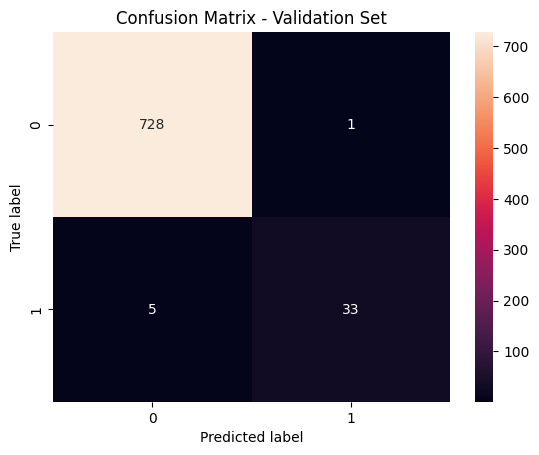


Metrics on Test Set:
Accuracy: 0.9191
F1 Score: 0.1842
AUC Score: 0.7685
False Negative Rate: 0.8108
False Positive Rate: 0.0439


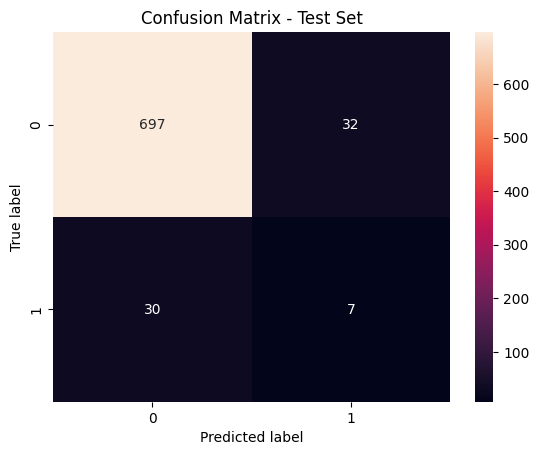

In [77]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_performance(model, X, y, set_name="Validation"):
    y_pred = model.predict(X)
    y_probs = model.predict_proba(X)[:, 1]  # Probabilities for the positive class
    
    accuracy = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    auc = roc_auc_score(y, y_probs)
    tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()
    
    fnr = fn / (fn + tp)  # False Negative Rate
    fpr = fp / (fp + tn)  # False Positive Rate

    print(f"\nMetrics on {set_name} Set:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC Score: {auc:.4f}")
    print(f"False Negative Rate: {fnr:.4f}")
    print(f"False Positive Rate: {fpr:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y, y_pred)
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title(f'Confusion Matrix - {set_name} Set')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Evaluate on the validation set
evaluate_performance(best_model, X_val_cb, y_val_cb, "Validation")

# Evaluate on the test set
evaluate_performance(best_model, X_test_cb, y_test_cb, "Test")

Theres a bit of overfitting to the validation set. Next, ill try to increase the regularization, lower the learning rate as well as the depth to make the model overfit less . 

In [78]:
# Define the grid of hyperparameters to search
param_distributions = {
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6],
    'l2_leaf_reg': [3, 5, 10],
    # Add other hyperparameters as needed
}

# Create a Pool with training data and a Pool for validation data
train_pool = Pool(X_train_smote_cb, y_train_smote_cb, cat_features=cat_features_indices)
validation_pool = Pool(X_val_cb, y_val_cb, cat_features=cat_features_indices)  # Validation pool

# Create a CatBoostClassifier instance
model = CatBoostClassifier(verbose=True)

# Perform the randomized search
randomized_search_result = model.randomized_search(
    param_distributions,
    train_pool,
    n_iter=20,  # Number of parameter settings sampled
    cv=3,
    partition_random_seed=42,
    search_by_train_test_split=False
)

# Output the best parameters
print("Best Parameters:", randomized_search_result['params'])

# Create a new CatBoostClassifier instance with the best parameters
best_model = CatBoostClassifier(**randomized_search_result['params'], cat_features=cat_features_indices, verbose=True)

# Fit the new model with early stopping
best_model.fit(train_pool, eval_set=validation_pool, early_stopping_rounds=50)  # Adjust early_stopping_rounds as needed

# Evaluate on the validation set using custom loss function
y_pred_val = best_model.predict(X_val_cb)
custom_loss_val = custom_loss(y_val_cb, y_pred_val)
print("Custom Loss on Validation Set:", custom_loss_val)

# Train the final model on the combined training and validation set with early stopping
final_train_pool = Pool(pd.concat([X_train_smote_cb, X_val_cb]), 
                        pd.concat([y_train_smote_cb, y_val_cb]), 
                        cat_features=cat_features_indices)
best_model.fit(final_train_pool, eval_set=validation_pool, early_stopping_rounds=50)

# Evaluate on the test set
y_pred_test = best_model.predict(X_test_cb)
custom_loss_test = custom_loss(y_test_cb, y_pred_test)
print("Custom Loss on Test Set:", custom_loss_test)

Training on fold [0/3]
0:	learn: 0.6855402	test: 0.6855004	best: 0.6855004 (0)	total: 36.1ms	remaining: 36s
1:	learn: 0.6796671	test: 0.6794840	best: 0.6794840 (1)	total: 70.9ms	remaining: 35.4s
2:	learn: 0.6744460	test: 0.6740501	best: 0.6740501 (2)	total: 111ms	remaining: 36.9s
3:	learn: 0.6678654	test: 0.6673992	best: 0.6673992 (3)	total: 146ms	remaining: 36.4s
4:	learn: 0.6624387	test: 0.6618365	best: 0.6618365 (4)	total: 193ms	remaining: 38.4s
5:	learn: 0.6570721	test: 0.6562994	best: 0.6562994 (5)	total: 234ms	remaining: 38.8s
6:	learn: 0.6508965	test: 0.6500104	best: 0.6500104 (6)	total: 289ms	remaining: 41s
7:	learn: 0.6451989	test: 0.6442045	best: 0.6442045 (7)	total: 357ms	remaining: 44.3s
8:	learn: 0.6393410	test: 0.6382340	best: 0.6382340 (8)	total: 408ms	remaining: 44.9s
9:	learn: 0.6352277	test: 0.6338362	best: 0.6338362 (9)	total: 456ms	remaining: 45.1s
10:	learn: 0.6307125	test: 0.6291442	best: 0.6291442 (10)	total: 507ms	remaining: 45.6s
11:	learn: 0.6250706	test: 0.62

In [80]:
# Print the best hyperparameters
print("Optimal Hyperparameters:", randomized_search_result['params'])

Optimal Hyperparameters: {'depth': 6, 'l2_leaf_reg': 3, 'learning_rate': 0.1}



Metrics on Validation Set:
Accuracy: 0.9922
F1 Score: 0.9167
AUC Score: 0.9975
False Negative Rate: 0.1316
False Positive Rate: 0.0014


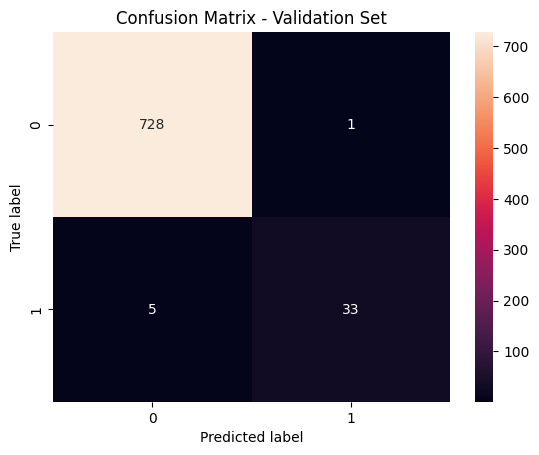


Metrics on Test Set:
Accuracy: 0.9191
F1 Score: 0.1842
AUC Score: 0.7685
False Negative Rate: 0.8108
False Positive Rate: 0.0439


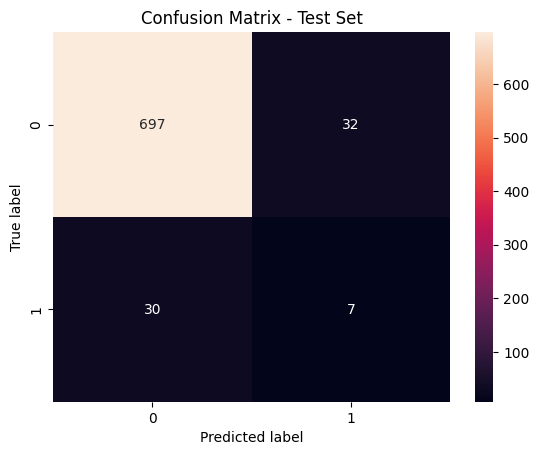

In [79]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_performance(model, X, y, set_name="Validation"):
    y_pred = model.predict(X)
    y_probs = model.predict_proba(X)[:, 1]  # Probabilities for the positive class
    
    accuracy = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    auc = roc_auc_score(y, y_probs)
    tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()
    
    fnr = fn / (fn + tp)  # False Negative Rate
    fpr = fp / (fp + tn)  # False Positive Rate

    print(f"\nMetrics on {set_name} Set:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC Score: {auc:.4f}")
    print(f"False Negative Rate: {fnr:.4f}")
    print(f"False Positive Rate: {fpr:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y, y_pred)
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title(f'Confusion Matrix - {set_name} Set')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Evaluate on the validation set
evaluate_performance(best_model, X_val_cb, y_val_cb, "Validation")

# Evaluate on the test set
evaluate_performance(best_model, X_test_cb, y_test_cb, "Test")

There is still some overfitting to the validation set. In the future, we need to address this by using a larger validation set, maybe tuning the hyperparameters more. Currently, the gridsearch takes around an hour to improve the catboost model, and so the computation time made it difficult to more optimally tune the hyperparameters. However, changing the threshold and weights using our domain loss still helps us decrease the false negatives. 